In [1]:
import os
import re

import anndata
import pandas as pd
import scanpy as sc
import numpy as np
import seaborn as sns
import tifffile

In [4]:

cell_probs = pd.read_csv('../data/breast/All_breast_processed_label_transferred_anchored_predictions.txt',
                      sep='\t')
cell_probs = cell_probs.transpose()
ms = cell_probs['max'].to_list()
cell_probs = cell_probs[[c for c in cell_probs.columns if c !='max']]
cts = [cell_probs.columns[i] for i in np.argmax(cell_probs.values, axis=1)]
secondary = np.sort(cell_probs.values, axis=1)[:, -1] - np.sort(cell_probs.values, axis=1)[:, -2]
cell_probs['predicted_cell_type'] = cts
cell_probs['probability'] = ms
cell_probs['distance_to_second'] = secondary
cell_probs

,CD8-T,Endothelial,CAF,Her2-Tumor,Normal-duct,NK,Mono-Macro,Treg,CD4-T,DC,NKT-cells,B,Plasma,Mast,LumB-Tumor,Basal-Tumor,LumA-Tumor,predicted_cell_type,probability,distance_to_second
HT206B1_H8_U1_AAACAAGTATCTCCCA-1,0.002781,0.051927,0.334458,0.023915,0.198311,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.006113,0.000000,0.0,0.302925,0.079571,0.000000,CAF,0.334458,0.031533
HT206B1_H8_U1_AAACAATCTACTAGCA-1,0.000000,0.000000,0.119018,0.047276,0.071357,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.244423,0.463033,0.054893,Basal-Tumor,0.463033,0.218610
HT206B1_H8_U1_AAACACCAATAACTGC-1,0.000000,0.000000,0.066781,0.000000,0.000000,0.0,0.874991,0.000000,0.000000,0.039538,0.0,0.000000,0.000000,0.0,0.013990,0.004700,0.000000,Mono-Macro,0.874991,0.808210
HT206B1_H8_U1_AAACAGAGCGACTCCT-1,0.000000,0.000000,0.008322,0.060485,0.251230,0.0,0.000000,0.000000,0.007088,0.000000,0.0,0.000000,0.000000,0.0,0.519162,0.153712,0.000000,LumB-Tumor,0.519162,0.267932
HT206B1_H8_U1_AAACAGCTTTCAGAAG-1,0.000000,0.000000,0.059723,0.000000,0.722219,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.218059,0.000000,0.000000,Normal-duct,0.722219,0.504160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT265B1_H1A2_U1_TTGTTTCACATCCAGG-1,0.000000,0.091920,0.022763,0.183868,0.230603,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.247428,0.223417,0.000000,LumB-Tumor,0.247428,0.016825
HT265B1_H1A2_U1_TTGTTTCATTAGTCTA-1,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,Plasma,1.000000,1.000000
HT265B1_H1A2_U1_TTGTTTCCATACAACT-1,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.992881,0.0,0.006605,0.000513,0.000000,Plasma,0.992881,0.986276
HT265B1_H1A2_U1_TTGTTTGTATTACACG-1,0.000000,0.036072,0.060534,0.000000,0.019267,0.0,0.179706,0.052119,0.213279,0.296608,0.0,0.000000,0.022246,0.0,0.066815,0.012811,0.040542,DC,0.296608,0.083329


In [5]:
metadata = pd.read_csv('../data/breast/All_breast_processed_label_transferred_anchored_metadata.txt',
                      sep='\t')
metadata = pd.merge(metadata, cell_probs, left_index=True, right_index=True)
metadata

,orig.ident,nCount_Spatial,nFeature_Spatial,sample,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters,case,integrated_snn_res.0.8,...,NKT-cells,B,Plasma,Mast,LumB-Tumor,Basal-Tumor,LumA-Tumor,predicted_cell_type,probability,distance_to_second
HT206B1_H8_U1_AAACAAGTATCTCCCA-1,HT206B1_H8_U1,1195,778,HT206B1_H8,8492,2143,12,6,HT206B1,6,...,0.0,0.006113,0.000000,0.0,0.302925,0.079571,0.000000,CAF,0.334458,0.031533
HT206B1_H8_U1_AAACAATCTACTAGCA-1,HT206B1_H8_U1,40160,7370,HT206B1_H8,11066,4055,0,0,HT206B1,0,...,0.0,0.000000,0.000000,0.0,0.244423,0.463033,0.054893,Basal-Tumor,0.463033,0.218610
HT206B1_H8_U1_AAACACCAATAACTGC-1,HT206B1_H8_U1,24709,6244,HT206B1_H8,11500,4685,3,7,HT206B1,7,...,0.0,0.000000,0.000000,0.0,0.013990,0.004700,0.000000,Mono-Macro,0.874991,0.808210
HT206B1_H8_U1_AAACAGAGCGACTCCT-1,HT206B1_H8_U1,1842,1020,HT206B1_H8,8922,2050,4,6,HT206B1,6,...,0.0,0.000000,0.000000,0.0,0.519162,0.153712,0.000000,LumB-Tumor,0.519162,0.267932
HT206B1_H8_U1_AAACAGCTTTCAGAAG-1,HT206B1_H8_U1,49222,9217,HT206B1_H8,11758,4950,16,9,HT206B1,9,...,0.0,0.000000,0.000000,0.0,0.218059,0.000000,0.000000,Normal-duct,0.722219,0.504160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT265B1_H1A2_U1_TTGTTTCACATCCAGG-1,HT265B1_H1A2_U1,6901,2656,HT265B1_H1,11259,2710,5,5,HT265B1,5,...,0.0,0.000000,0.000000,0.0,0.247428,0.223417,0.000000,LumB-Tumor,0.247428,0.016825
HT265B1_H1A2_U1_TTGTTTCATTAGTCTA-1,HT265B1_H1A2_U1,7402,3050,HT265B1_H1,11019,3067,11,2,HT265B1,2,...,0.0,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,Plasma,1.000000,1.000000
HT265B1_H1A2_U1_TTGTTTCCATACAACT-1,HT265B1_H1A2_U1,12933,4142,HT265B1_H1,12574,4138,3,1,HT265B1,1,...,0.0,0.000000,0.992881,0.0,0.006605,0.000513,0.000000,Plasma,0.992881,0.986276
HT265B1_H1A2_U1_TTGTTTGTATTACACG-1,HT265B1_H1A2_U1,4191,2252,HT265B1_H1,10777,2764,5,11,HT265B1,11,...,0.0,0.000000,0.022246,0.0,0.066815,0.012811,0.040542,DC,0.296608,0.083329


In [6]:
filemap = pd.read_csv('../data/sample_map.txt', sep='\t')
filemap

,sample_id,spaceranger_output,highres_image,disease
0,HT206B1_H8_U2,/data/spatial_transcriptomics/spaceranger_outp...,/home/estorrs/spatial-analysis/data/highres_im...,brca
1,HT206B1_H8_U3,/data/spatial_transcriptomics/spaceranger_outp...,/home/estorrs/spatial-analysis/data/highres_im...,brca
2,HT206B1_H8_U4,/data/spatial_transcriptomics/spaceranger_outp...,/home/estorrs/spatial-analysis/data/highres_im...,brca
3,HT206B1_H8_U5,/data/spatial_transcriptomics/spaceranger_outp...,/home/estorrs/spatial-analysis/data/highres_im...,brca
4,HT206B1_H8_Bn,/data/spatial_transcriptomics/spaceranger_outp...,NaN,brca
5,HT235B1_H1_U1,/data/spatial_transcriptomics/spaceranger_outp...,/home/estorrs/spatial-analysis/data/highres_im...,brca
6,HT235B1_H1_U2,/data/spatial_transcriptomics/spaceranger_outp...,NaN,brca
7,HT235B1_H2_U1,/data/spatial_transcriptomics/spaceranger_outp...,/home/estorrs/spatial-analysis/data/highres_im...,brca
8,HT235B1_H3_U1,/data/spatial_transcriptomics/spaceranger_outp...,/home/estorrs/spatial-analysis/data/highres_im...,brca
9,HT243B1_H3A2_U1,/data/spatial_transcriptomics/spaceranger_outp...,/home/estorrs/spatial-analysis/data/highres_im...,brca


In [7]:
# just do breast for now
filemap = filemap[filemap['disease']=='brca']

In [8]:
from collections import Counter
Counter(cell_probs['predicted_cell_type']).most_common()

[('LumB-Tumor', 19547),
 ('Plasma', 14345),
 ('CAF', 9074),
 ('Basal-Tumor', 6334),
 ('Endothelial', 3894),
 ('Mono-Macro', 3088),
 ('Normal-duct', 2834),
 ('CD4-T', 882),
 ('DC', 413),
 ('B', 174),
 ('LumA-Tumor', 121),
 ('Her2-Tumor', 21),
 ('Mast', 13),
 ('Treg', 6),
 ('CD8-T', 1)]

In [9]:
from collections import Counter
Counter(cell_probs[cell_probs['distance_to_second']>.25]['predicted_cell_type']).most_common()

[('Plasma', 12410),
 ('LumB-Tumor', 9327),
 ('CAF', 5969),
 ('Mono-Macro', 2203),
 ('Endothelial', 2103),
 ('Basal-Tumor', 2042),
 ('Normal-duct', 1494),
 ('DC', 169),
 ('CD4-T', 143),
 ('B', 85),
 ('LumA-Tumor', 4),
 ('Mast', 3),
 ('Her2-Tumor', 1)]

In [8]:
sorted(set(metadata['orig.ident']))

['HT206B1_H8_U1',
 'HT206B1_H8_U2',
 'HT206B1_H8_U3',
 'HT206B1_H8_U4',
 'HT206B1_H8_U5',
 'HT235B1_H1_U1',
 'HT235B1_H1_U2',
 'HT235B1_H2_U1',
 'HT235B1_H3_U1',
 'HT243B1_H3A2_U1',
 'HT243B1_H3A2_U2',
 'HT243B1_H3A2_U3',
 'HT243B1_H3A2_U4',
 'HT243B1_H4A2_U1',
 'HT243B1_H4A2_U2',
 'HT262B1_H2A2_U1',
 'HT263B1_H1A2_U1',
 'HT265B1_H1A2_U1']

In [61]:
adatas = []
for s_id, fp, he in zip(filemap['sample_id'], filemap['spaceranger_output'], filemap['highres_image']):
    if not pd.isnull(he):
        adata = sc.read_visium(fp)
        adata.var_names_make_unique()
        adata.obs['sample_id'] = s_id
        adata.obs.index = [f'{s}_{b}' for s, b in zip(adata.obs['sample_id'], adata.obs.index)]
        adata.obs['cell_type'] = [metadata.loc[x, 'predicted_cell_type'] if x in metadata.index else None
                                  for x in adata.obs.index]
        adata.obs['% difference to second'] = [metadata.loc[x, 'distance_to_second'] if x in metadata.index else None
                                  for x in adata.obs.index]
        
        adatas.append(adata)

adata = anndata.concat(adatas)
adata

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Vari

AnnData object with n_obs × n_vars = 53217 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'sample_id', 'cell_type', '% difference to second'
    obsm: 'spatial'

In [46]:
Counter(adatas[0].obs['cell_type']).most_common()

[('Plasma', 1019),
 ('LumB-Tumor', 943),
 ('CAF', 745),
 ('Basal-Tumor', 484),
 ('Endothelial', 279),
 ('Mono-Macro', 206),
 ('Normal-duct', 129),
 ('CD4-T', 70),
 ('DC', 36),
 ('B', 24),
 ('LumA-Tumor', 12),
 ('Mast', 1),
 ('Treg', 1)]

In [47]:
adata.obs

,in_tissue,array_row,array_col,sample_id,cell_type
HT206B1_H8_U2_AAACAACGAATAGTTC-1,1,0,16,HT206B1_H8_U2,Basal-Tumor
HT206B1_H8_U2_AAACAAGTATCTCCCA-1,1,50,102,HT206B1_H8_U2,LumB-Tumor
HT206B1_H8_U2_AAACAATCTACTAGCA-1,1,3,43,HT206B1_H8_U2,CAF
HT206B1_H8_U2_AAACACCAATAACTGC-1,1,59,19,HT206B1_H8_U2,LumB-Tumor
HT206B1_H8_U2_AAACAGAGCGACTCCT-1,1,14,94,HT206B1_H8_U2,CAF
...,...,...,...,...,...
HT265B1_H1A2_U1_TTGTTTCACATCCAGG-1,1,58,42,HT265B1_H1A2_U1,LumB-Tumor
HT265B1_H1A2_U1_TTGTTTCATTAGTCTA-1,1,60,30,HT265B1_H1A2_U1,Plasma
HT265B1_H1A2_U1_TTGTTTCCATACAACT-1,1,45,27,HT265B1_H1A2_U1,Plasma
HT265B1_H1A2_U1_TTGTTTGTATTACACG-1,1,73,41,HT265B1_H1A2_U1,DC


In [48]:
adata = adata[[i for i in metadata.index if i in adata.obs.index]]
adata.obs = pd.merge(adata.obs, metadata, left_index=True, right_index=True).loc[adata.obs.index]
adata.obs

,in_tissue,array_row,array_col,sample_id,cell_type,orig.ident,nCount_Spatial,nFeature_Spatial,sample,nCount_SCT,...,NKT-cells,B,Plasma,Mast,LumB-Tumor,Basal-Tumor,LumA-Tumor,predicted_cell_type,probability,distance_to_second
HT206B1_H8_U2_AAACAACGAATAGTTC-1,1,0,16,HT206B1_H8_U2,Basal-Tumor,HT206B1_H8_U2,18069,4960,HT206B1_H8,11654,...,0.0,0.000000,0.000000,0.0,0.168145,0.655413,0.000000,Basal-Tumor,0.655413,0.487268
HT206B1_H8_U2_AAACAAGTATCTCCCA-1,1,50,102,HT206B1_H8_U2,LumB-Tumor,HT206B1_H8_U2,12427,3310,HT206B1_H8,11160,...,0.0,0.000000,0.144319,0.0,0.345408,0.000000,0.000000,LumB-Tumor,0.345408,0.081039
HT206B1_H8_U2_AAACAATCTACTAGCA-1,1,3,43,HT206B1_H8_U2,CAF,HT206B1_H8_U2,17944,4364,HT206B1_H8,11462,...,0.0,0.000000,0.096434,0.0,0.124714,0.000000,0.000000,CAF,0.765617,0.640904
HT206B1_H8_U2_AAACACCAATAACTGC-1,1,59,19,HT206B1_H8_U2,LumB-Tumor,HT206B1_H8_U2,2463,1261,HT206B1_H8,8966,...,0.0,0.008552,0.000000,0.0,0.444339,0.066016,0.000000,LumB-Tumor,0.444339,0.049623
HT206B1_H8_U2_AAACAGAGCGACTCCT-1,1,14,94,HT206B1_H8_U2,CAF,HT206B1_H8_U2,23925,5394,HT206B1_H8,11299,...,0.0,0.000000,0.114782,0.0,0.006338,0.000000,0.000000,CAF,0.766976,0.652194
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT265B1_H1A2_U1_TTGTTTCACATCCAGG-1,1,58,42,HT265B1_H1A2_U1,LumB-Tumor,HT265B1_H1A2_U1,6901,2656,HT265B1_H1,11259,...,0.0,0.000000,0.000000,0.0,0.247428,0.223417,0.000000,LumB-Tumor,0.247428,0.016825
HT265B1_H1A2_U1_TTGTTTCATTAGTCTA-1,1,60,30,HT265B1_H1A2_U1,Plasma,HT265B1_H1A2_U1,7402,3050,HT265B1_H1,11019,...,0.0,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,Plasma,1.000000,1.000000
HT265B1_H1A2_U1_TTGTTTCCATACAACT-1,1,45,27,HT265B1_H1A2_U1,Plasma,HT265B1_H1A2_U1,12933,4142,HT265B1_H1,12574,...,0.0,0.000000,0.992881,0.0,0.006605,0.000513,0.000000,Plasma,0.992881,0.986276
HT265B1_H1A2_U1_TTGTTTGTATTACACG-1,1,73,41,HT265B1_H1A2_U1,DC,HT265B1_H1A2_U1,4191,2252,HT265B1_H1,10777,...,0.0,0.000000,0.022246,0.0,0.066815,0.012811,0.040542,DC,0.296608,0.083329


In [49]:
sample_id_to_he = {s:tifffile.imread(fp)
                  for s, fp in zip(filemap['sample_id'], filemap['highres_image'])
                  if not pd.isnull(fp)}

###### sanity check

In [50]:
sc.set_figure_params(dpi_save=300, )
sc.settings.figdir = '../data/breast/outputs'

In [58]:
cell_type_to_color = {cell:color
        for color, cell in zip(sns.color_palette('tab20').as_hex(), sorted(set(adata.obs['cell_type'])))}

In [57]:
len(set(adata.obs['cell_type']))

15

In [56]:
cell_type_to_color

{'B': '#1f77b4',
 'Basal-Tumor': '#ff7f0e',
 'CAF': '#2ca02c',
 'CD4-T': '#d62728',
 'CD8-T': '#9467bd',
 'DC': '#8c564b',
 'Endothelial': '#e377c2',
 'Her2-Tumor': '#7f7f7f',
 'LumA-Tumor': '#bcbd22',
 'LumB-Tumor': '#17becf'}

In [30]:
adatas[0].uns['cell_type_colors']

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896']

In [59]:
for a in adatas: print(len(set(a.obs['cell_type'])))

13
12
13
13
12
10
10
13
12
13
12
12
10
14
12
11


HT206B1_H8_U2


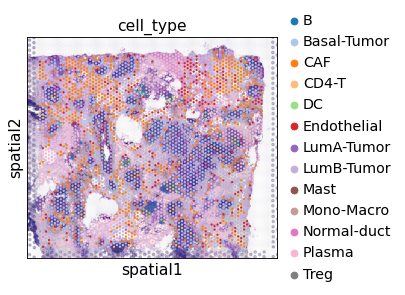

HT206B1_H8_U3


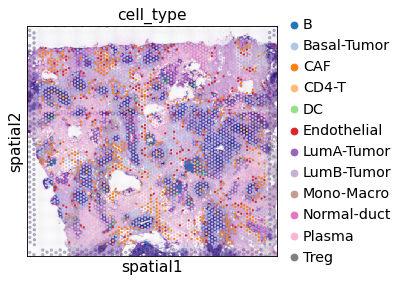

HT206B1_H8_U4


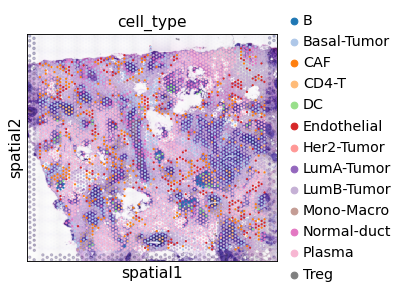

HT206B1_H8_U5


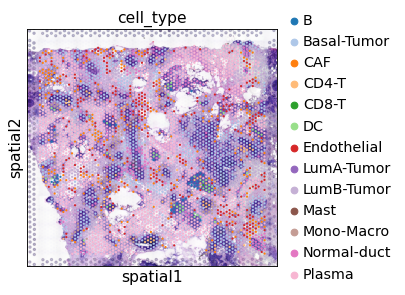

HT235B1_H1_U1


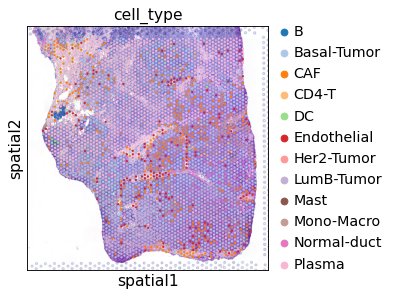

HT235B1_H2_U1


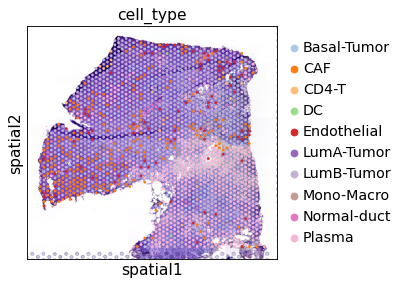

HT235B1_H3_U1


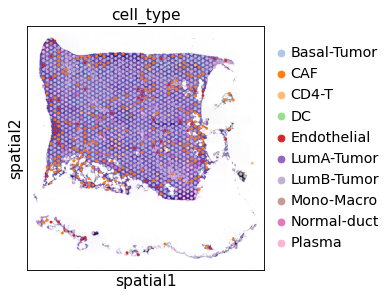

HT243B1_H3A2_U1


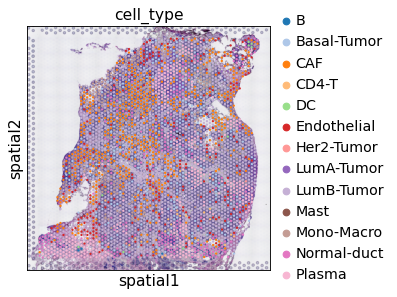

HT243B1_H3A2_U2


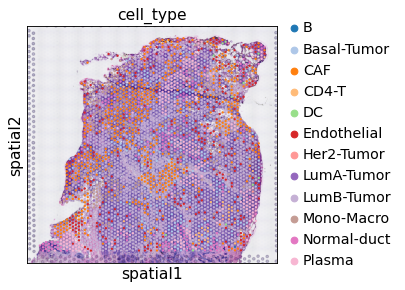

HT243B1_H3A2_U3


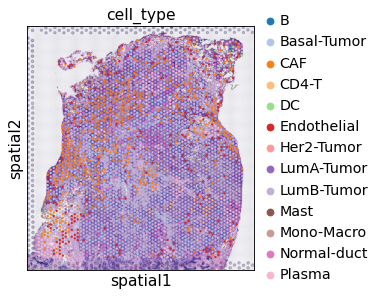

HT243B1_H3A2_U4


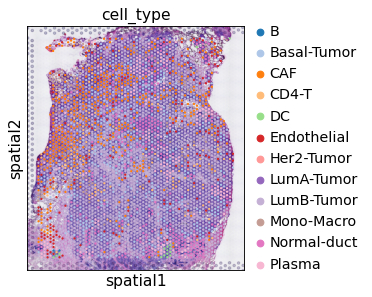

HT243B1_H4A2_U1


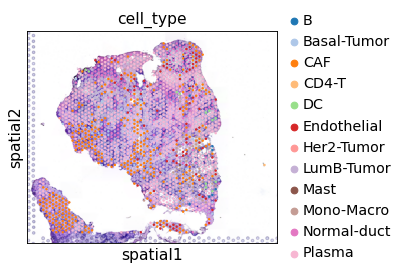

HT243B1_H4A2_U2


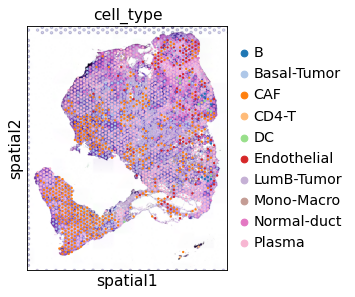

HT262B1_H2A2_U1


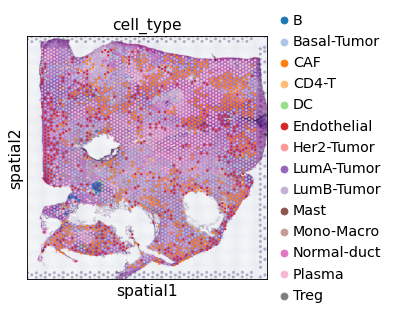

HT263B1_H1A2_U1


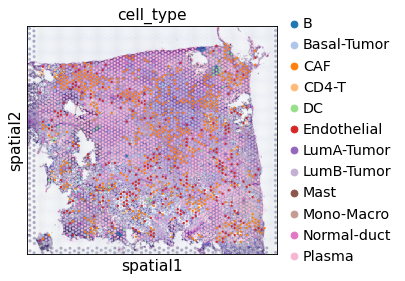

HT265B1_H1A2_U1


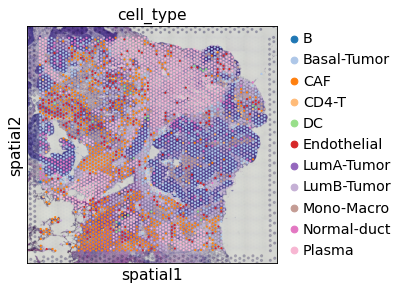

In [60]:
for a in adatas:
    
    a.uns['cell_type_colors'] = [cell_type_to_color[c] for c in sorted(set(a.obs['cell_type']))]
    s = a.obs['sample_id'][0]
    print(s)
    sc.pl.spatial(a, color=['cell_type'], save=f'{s}.png')

HT206B1_H8_U2


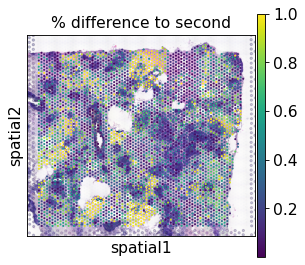

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'feature_types' as categorical


HT206B1_H8_U3


... storing 'genome' as categorical


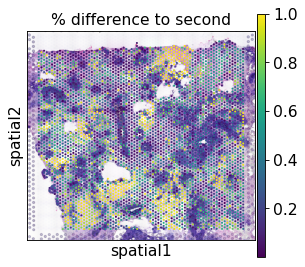

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'feature_types' as categorical


HT206B1_H8_U4


... storing 'genome' as categorical


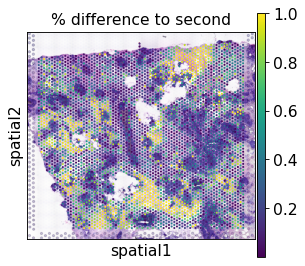

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'feature_types' as categorical


HT206B1_H8_U5


... storing 'genome' as categorical


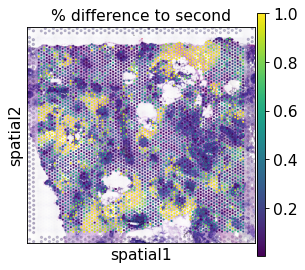

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'feature_types' as categorical


HT235B1_H1_U1


... storing 'genome' as categorical


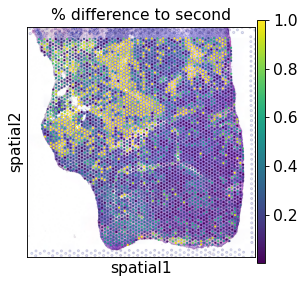

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'feature_types' as categorical


HT235B1_H2_U1


... storing 'genome' as categorical


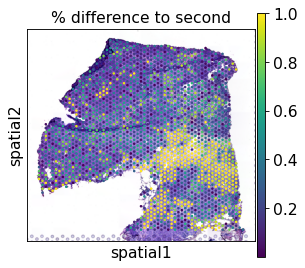

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'feature_types' as categorical


HT235B1_H3_U1


... storing 'genome' as categorical


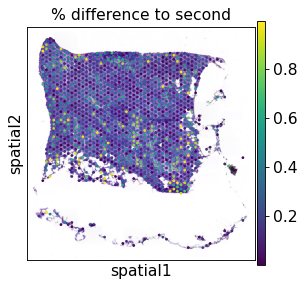

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'feature_types' as categorical


HT243B1_H3A2_U1


... storing 'genome' as categorical


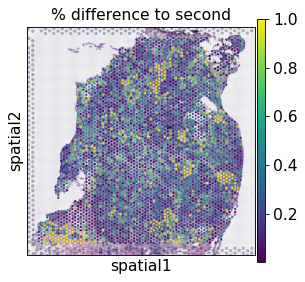

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


HT243B1_H3A2_U2


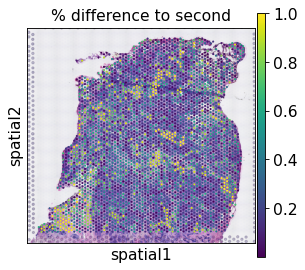

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'feature_types' as categorical


HT243B1_H3A2_U3


... storing 'genome' as categorical


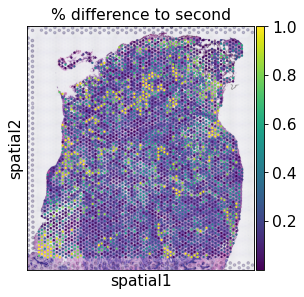

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical


HT243B1_H3A2_U4


... storing 'feature_types' as categorical
... storing 'genome' as categorical


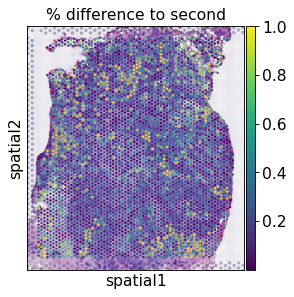

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'feature_types' as categorical


HT243B1_H4A2_U1


... storing 'genome' as categorical


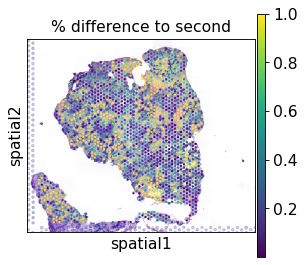

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'feature_types' as categorical


HT243B1_H4A2_U2


... storing 'genome' as categorical


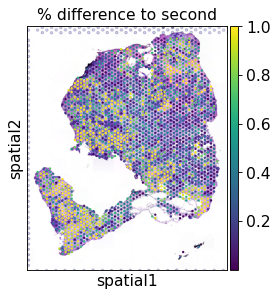

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'feature_types' as categorical


HT262B1_H2A2_U1


... storing 'genome' as categorical


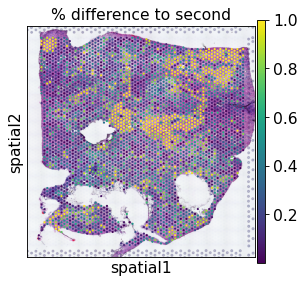

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'feature_types' as categorical


HT263B1_H1A2_U1


... storing 'genome' as categorical


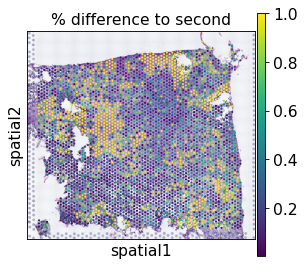

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical


HT265B1_H1A2_U1


... storing 'feature_types' as categorical
... storing 'genome' as categorical


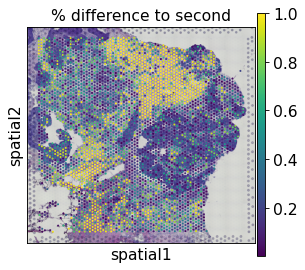

In [63]:
for a in adatas:
    s = a.obs['sample_id'][0]
    print(s)
    sc.pl.spatial(a, color=['% difference to second'], save=f'distance_to_second_{s}.png')

In [13]:
adata

AnnData object with n_obs × n_vars = 53217 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'sample_id', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'sample', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'seurat_clusters', 'case', 'integrated_snn_res.0.8', 'CD8-T', 'Endothelial', 'CAF', 'Her2-Tumor', 'Normal-duct', 'NK', 'Mono-Macro', 'Treg', 'CD4-T', 'DC', 'NKT-cells', 'B', 'Plasma', 'Mast', 'LumB-Tumor', 'Basal-Tumor', 'LumA-Tumor', 'predicted_cell_type', 'probability', 'distance_to_second'
    obsm: 'spatial'

In [14]:
sample_id_to_he.keys()

dict_keys(['HT206B1_H8_U2', 'HT206B1_H8_U3', 'HT206B1_H8_U4', 'HT206B1_H8_U5', 'HT235B1_H1_U1', 'HT235B1_H2_U1', 'HT235B1_H3_U1', 'HT243B1_H3A2_U1', 'HT243B1_H3A2_U2', 'HT243B1_H3A2_U3', 'HT243B1_H3A2_U4', 'HT243B1_H4A2_U1', 'HT243B1_H4A2_U2', 'HT262B1_H2A2_U1', 'HT263B1_H1A2_U1', 'HT265B1_H1A2_U1'])

In [15]:
coords = adata.obsm['spatial']

In [16]:
boxes = []
sample_to_diameter = {
    a.obs['sample_id'][0]:a.uns['spatial'][list(a.uns['spatial'].keys())[0]]['scalefactors']['spot_diameter_fullres']
    for i, a in enumerate(adatas)}
for s, (c, r) in zip(adata.obs['sample_id'], coords):
    d = sample_to_diameter[s]
    r1, r2 = int(r - (d * .5)),  int(r + (d * .5))
    c1, c2 =  int(c - (d * .5)),  int(c + (d * .5))
    boxes.append([(r1, c1), (r2, c2)])

imgs = [sample_id_to_he[s][r1:r2, c1:c2] for ((r1, c1), (r2, c2)), s in zip(boxes, adata.obs['sample_id'])]
# imgs = [resize(img, (64, 64, 3)) for img in imgs]

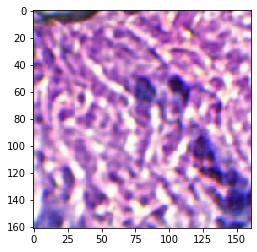

In [17]:
import matplotlib.pyplot as plt
plt.imshow(imgs[0])

In [18]:
i = 160
test_id = adata.obs.index[i]
test_id

'HT206B1_H8_U2_AAGCTCTTTCATGGTG-1'

In [19]:
adata.obs.iloc[i]

in_tissue                             1
array_row                            57
array_col                            81
sample_id                 HT206B1_H8_U2
orig.ident                HT206B1_H8_U2
nCount_Spatial                    19042
nFeature_Spatial                   4696
sample                       HT206B1_H8
nCount_SCT                        11591
nFeature_SCT                       4325
SCT_snn_res.0.8                       0
seurat_clusters                       0
case                            HT206B1
integrated_snn_res.0.8                0
CD8-T                               0.0
Endothelial                         0.0
CAF                            0.015393
Her2-Tumor                     0.005567
Normal-duct                    0.191646
NK                                  0.0
Mono-Macro                          0.0
Treg                                0.0
CD4-T                               0.0
DC                                  0.0
NKT-cells                           0.0


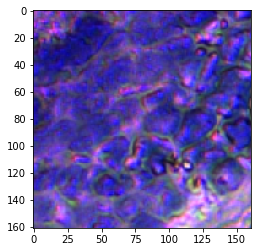

In [20]:
plt.imshow(imgs[i])

... storing 'sample_id' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


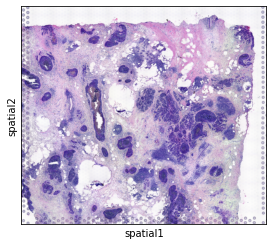

In [21]:
sc.pl.spatial(adatas[0])

... storing 'highlight' as categorical


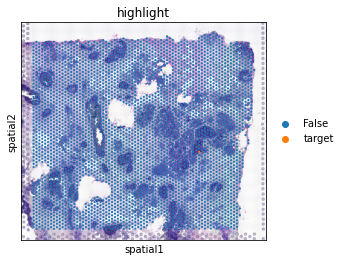

In [22]:
adatas[0].obs['highlight'] = ['target' if c==test_id else False for c in adatas[0].obs.index]
sc.pl.spatial(adatas[0], color=['highlight'])

In [23]:
## save the data
output_dir = '../data/breast/model_inputs'
from pathlib import Path
Path(output_dir).mkdir(exist_ok=True, parents=True)

In [24]:
adata.write_h5ad(os.path.join(output_dir, 'adata.h5ad'))

... storing 'sample_id' as categorical
... storing 'orig.ident' as categorical
... storing 'sample' as categorical
... storing 'case' as categorical
... storing 'predicted_cell_type' as categorical


In [30]:
data = []
order = sorted(set(adata.obs['predicted_cell_type']))
for s in sorted(set(adata.obs['sample_id'])):
    f = adata[adata.obs['sample_id']==s]
    cs = Counter(f.obs['predicted_cell_type'])
    data.append([cs.get(c, 0) for c in order])
df = pd.DataFrame(data=data, index=sorted(set(adata.obs['sample_id'])), columns=order)
df

,B,Basal-Tumor,CAF,CD4-T,CD8-T,DC,Endothelial,Her2-Tumor,LumA-Tumor,LumB-Tumor,Mast,Mono-Macro,Normal-duct,Plasma,Treg
HT206B1_H8_U2,24,484,745,70,0,36,279,0,12,943,1,206,129,1019,1
HT206B1_H8_U3,24,634,522,79,0,53,240,0,7,1038,0,234,159,1320,1
HT206B1_H8_U4,25,646,372,77,0,54,274,1,12,1074,0,174,176,1246,1
HT206B1_H8_U5,33,720,288,72,1,53,313,0,16,977,1,164,186,1450,0
HT235B1_H1_U1,9,403,398,32,0,11,180,1,0,1284,3,199,94,1218,0
HT235B1_H2_U1,0,65,244,25,0,2,81,0,1,940,0,58,26,607,0
HT235B1_H3_U1,0,115,222,41,0,2,52,0,5,756,0,12,38,49,0
HT243B1_H3A2_U1,3,246,622,25,0,10,258,4,8,1374,1,322,245,432,0
HT243B1_H3A2_U2,1,209,662,42,0,13,296,5,17,1444,0,308,190,328,0
HT243B1_H3A2_U3,2,350,551,72,0,10,218,1,22,1666,1,239,212,287,0


In [32]:
val_samples = ['HT206B1_H8_U2', 'HT206B1_H8_U3', 'HT206B1_H8_U4', 'HT206B1_H8_U5']
exclude = ['Her2-Tumor', 'CD8-T', 'Treg']

In [34]:
set(adata.obs['sample_id'])

{'HT206B1_H8_U2',
 'HT206B1_H8_U3',
 'HT206B1_H8_U4',
 'HT206B1_H8_U5',
 'HT235B1_H1_U1',
 'HT235B1_H2_U1',
 'HT235B1_H3_U1',
 'HT243B1_H3A2_U1',
 'HT243B1_H3A2_U2',
 'HT243B1_H3A2_U3',
 'HT243B1_H3A2_U4',
 'HT243B1_H4A2_U1',
 'HT243B1_H4A2_U2',
 'HT262B1_H2A2_U1',
 'HT263B1_H1A2_U1',
 'HT265B1_H1A2_U1'}

In [35]:
from PIL import Image
from skimage.transform import resize
he_dir = os.path.join(output_dir, 'he_load_from_dir')
Path(he_dir).mkdir(parents=True, exist_ok=True)



for t in sorted(set(adata.obs['predicted_cell_type'])):
    if t not in exclude:
        Path(os.path.join(he_dir, 'train', t)).mkdir(parents=True, exist_ok=True)
        Path(os.path.join(he_dir, 'val', t)).mkdir(parents=True, exist_ok=True)
for x, s_id, label, sample in zip(imgs, adata.obs.index, adata.obs['predicted_cell_type'], adata.obs['sample_id']):
    if label not in exclude:
        reshaped = resize(x, (224, 224, 3))
        im = Image.fromarray((reshaped * 255).astype(np.uint8))
        if sample not in val_samples:
            im.save(os.path.join(he_dir, 'train', label, f'{s_id}.jpeg'))
        else:
            im.save(os.path.join(he_dir, 'val', label, f'{s_id}.jpeg'))

In [26]:
x = np.asarray(imgs)
np.save('../data/breast/model_inputs/he.npy', x)

In [114]:
metadata.shape, adata.shape, len(imgs)

((60747, 30), (53217, 36601), 53217)

In [27]:
trans = pd.read_csv('../data/breast/All_breast_processed_label_transferred_anchored_sctransform.txt',
                      sep='\t')
trans

,HT206B1_H8_U1_AAACAAGTATCTCCCA-1,HT206B1_H8_U1_AAACAATCTACTAGCA-1,HT206B1_H8_U1_AAACACCAATAACTGC-1,HT206B1_H8_U1_AAACAGAGCGACTCCT-1,HT206B1_H8_U1_AAACAGCTTTCAGAAG-1,HT206B1_H8_U1_AAACAGGGTCTATATT-1,HT206B1_H8_U1_AAACATTTCCCGGATT-1,HT206B1_H8_U1_AAACCCGAACGAAATC-1,HT206B1_H8_U1_AAACCGGGTAGGTACC-1,HT206B1_H8_U1_AAACCGTTCGTCCAGG-1,...,HT265B1_H1A2_U1_TTGTGTTTCCCGAAAG-1,HT265B1_H1A2_U1_TTGTTAGCAAATTCGA-1,HT265B1_H1A2_U1_TTGTTCAGTGTGCTAC-1,HT265B1_H1A2_U1_TTGTTCTAGATACGCT-1,HT265B1_H1A2_U1_TTGTTGTGTGTCAAGA-1,HT265B1_H1A2_U1_TTGTTTCACATCCAGG-1,HT265B1_H1A2_U1_TTGTTTCATTAGTCTA-1,HT265B1_H1A2_U1_TTGTTTCCATACAACT-1,HT265B1_H1A2_U1_TTGTTTGTATTACACG-1,HT265B1_H1A2_U1_TTGTTTGTGTAAATTC-1
LINC02593,-0.173065,-0.160452,-0.197712,-0.180909,-0.133049,-0.161520,-0.210028,-0.201687,-0.197514,-0.203900,...,-0.110886,-0.110382,-0.092648,-0.110591,-0.103341,-0.099972,-0.101021,-0.108285,-0.092292,-0.108877
SAMD11,-0.239568,-0.329407,-0.356034,-0.255967,-0.302603,-0.216699,-0.352009,-0.305555,-0.294407,-0.356973,...,-0.200277,-0.250548,-0.331403,-0.244560,-0.310798,-0.320852,-0.318212,-0.281452,-0.331660,-0.275247
HES4,-0.747521,2.236605,0.271764,0.507936,-0.013247,-0.587775,-1.619749,-1.227219,-0.296719,0.877330,...,4.802736,-0.290077,0.199145,-0.394033,-0.622844,0.803959,-0.425877,-1.534711,0.224499,-0.880258
ISG15,-1.165740,1.044517,1.430808,0.201775,1.786577,1.689833,3.068884,-1.536031,-1.478595,-0.418358,...,-1.392155,-1.410579,-1.227321,4.619074,-0.331095,-1.312556,6.492627,-1.398775,-1.223125,-1.403338
TNFRSF18,-0.345096,-0.528598,2.436792,-0.370517,-0.496502,-0.310384,-0.535123,-0.450495,-0.432027,-0.549687,...,-0.452455,2.018081,-0.213380,-0.405047,-0.294929,-0.265404,-0.274078,-0.353595,-0.211134,-0.363422
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-ND5,-0.894951,-1.064643,0.038697,3.851602,0.260619,-0.763386,1.639488,1.394117,-0.199167,2.072569,...,-0.817363,-0.747460,1.547635,-1.356711,-0.399485,0.815025,-0.285039,0.804444,-1.186769,0.028127
MT-ND6,-0.150307,-0.212271,-0.222666,25.929519,2.676943,-0.136712,-0.217950,-0.189261,-0.182660,-0.222190,...,-0.225994,-0.201825,-0.120916,-0.205080,-0.156728,-0.143776,-0.147582,-0.182464,-0.119928,-0.186779
MT-CYB,0.765703,-1.180000,0.981966,4.300287,0.823762,-1.512476,1.692272,1.244658,1.007862,1.752486,...,-0.517074,-0.299338,-1.252930,-2.109290,-0.646023,1.722702,2.712133,-1.021694,-0.945186,0.084415
AC011043.1,-0.029825,-0.175164,-0.142310,-0.038587,-0.190300,-0.018126,-0.115043,-0.068758,-0.061271,-0.132431,...,-0.220291,-0.193838,-0.105531,-0.197399,-0.144550,-0.130422,-0.134572,-0.172663,-0.104456,-0.177380


In [28]:
# save trans as anndata
t_adata = anndata.AnnData(X=trans.values.transpose())
t_adata.obs.index = trans.columns
t_adata.var.index = trans.index
t_adata = t_adata[adata.obs.index]
t_adata

View of AnnData object with n_obs × n_vars = 53217 × 3000

In [29]:
t_adata.write_h5ad(os.path.join(output_dir, 'sctransform_adata.h5ad'))

#### HT206 breast image classification data prep example

In [2]:
metadata = pd.read_csv('../data/brca_HT206/BRCA_206B1_seurat_annot_HandEv3_metadata.txt',
                      sep='\t')
metadata

,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters,orig_cluster,cell_type_image,HandE_v3
AAACAAGTATCTCCCA-1,SeuratProject,1195,778,5615,1444,0,0,0,Connective_1,Others
AAACAATCTACTAGCA-1,SeuratProject,40160,7370,7616,3449,2,2,2,DCIS_connective,Tumor_IDC
AAACACCAATAACTGC-1,SeuratProject,24709,6244,7450,3396,10,10,10,Connective_5,Others
AAACAGAGCGACTCCT-1,SeuratProject,1842,1020,5852,1394,1,1,1,Connective_2,Others
AAACAGCTTTCAGAAG-1,SeuratProject,49222,9217,8601,4330,7,7,7,TDLU,Normal_TDLU
...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,SeuratProject,6233,2829,6598,2828,8,8,8,Connective_3,Others
TTGTTTCACATCCAGG-1,SeuratProject,44782,7502,7672,3442,6,6,6,IDC,Tumor_IDC
TTGTTTCATTAGTCTA-1,SeuratProject,4678,2127,6315,2127,4,4,4,Connective_4,Others
TTGTTTCCATACAACT-1,SeuratProject,1730,978,5789,1387,0,0,0,Connective_1,Others


In [3]:
adata = sc.read_visium('../data/brca_HT206/206B1_ST_Bn1_1/')
adata.var_names_make_unique()
adata

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 3651 × 36601
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [4]:
he_img = tifffile.imread('../data/brca_HT206/high_res.tif')
he_img.shape

(22449, 22103, 3)

In [5]:
# merge in seurat metadata
order = adata.obs.index.to_list()
adata.obs = pd.merge(adata.obs, metadata, left_index=True, right_index=True).loc[order]
adata.obs

,in_tissue,array_row,array_col,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters,orig_cluster,cell_type_image,HandE_v3
AAACAAGTATCTCCCA-1,1,50,102,SeuratProject,1195,778,5615,1444,0,0,0,Connective_1,Others
AAACAATCTACTAGCA-1,1,3,43,SeuratProject,40160,7370,7616,3449,2,2,2,DCIS_connective,Tumor_IDC
AAACACCAATAACTGC-1,1,59,19,SeuratProject,24709,6244,7450,3396,10,10,10,Connective_5,Others
AAACAGAGCGACTCCT-1,1,14,94,SeuratProject,1842,1020,5852,1394,1,1,1,Connective_2,Others
AAACAGCTTTCAGAAG-1,1,43,9,SeuratProject,49222,9217,8601,4330,7,7,7,TDLU,Normal_TDLU
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77,SeuratProject,6233,2829,6598,2828,8,8,8,Connective_3,Others
TTGTTTCACATCCAGG-1,1,58,42,SeuratProject,44782,7502,7672,3442,6,6,6,IDC,Tumor_IDC
TTGTTTCATTAGTCTA-1,1,60,30,SeuratProject,4678,2127,6315,2127,4,4,4,Connective_4,Others
TTGTTTCCATACAACT-1,1,45,27,SeuratProject,1730,978,5789,1387,0,0,0,Connective_1,Others


In [6]:
img = adata.uns['spatial']['BRCA_206B1']['images']['hires']
img.shape

(2000, 1969, 3)

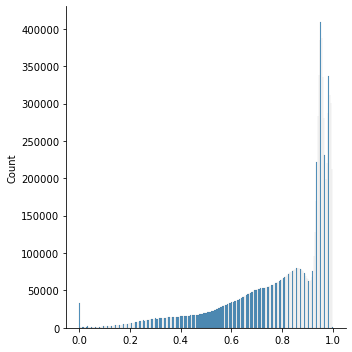

In [7]:
sns.displot(img.flatten())

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'orig.ident' as categorical
... storing 'cell_type_image' as categorical
... storing 'HandE_v3' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


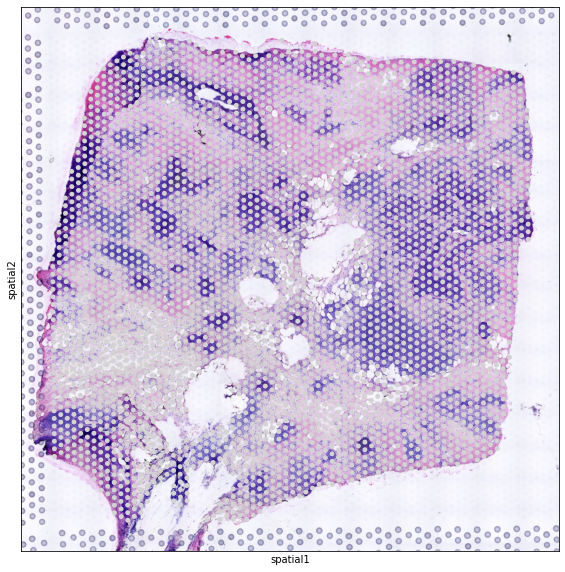

In [8]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (10, 10)
sc.pl.spatial(adata)

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


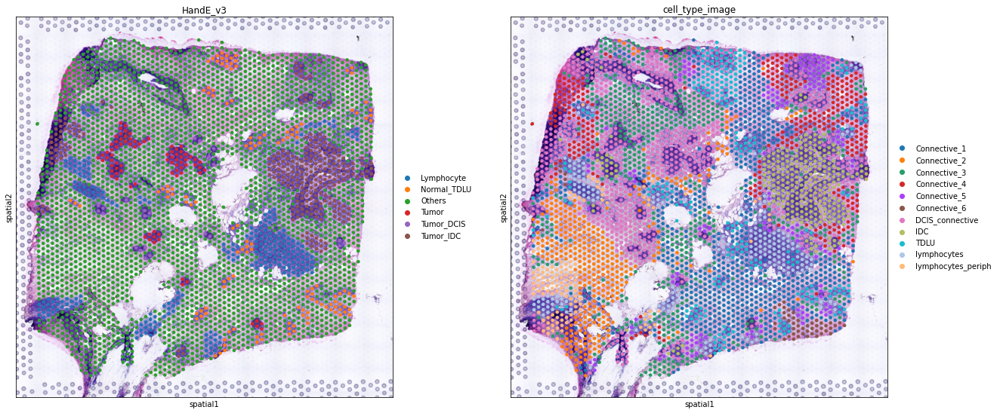

In [9]:
sc.pl.spatial(adata, color=['HandE_v3', 'cell_type_image'])

In [10]:
adata.obs

,in_tissue,array_row,array_col,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters,orig_cluster,cell_type_image,HandE_v3
AAACAAGTATCTCCCA-1,1,50,102,SeuratProject,1195,778,5615,1444,0,0,0,Connective_1,Others
AAACAATCTACTAGCA-1,1,3,43,SeuratProject,40160,7370,7616,3449,2,2,2,DCIS_connective,Tumor_IDC
AAACACCAATAACTGC-1,1,59,19,SeuratProject,24709,6244,7450,3396,10,10,10,Connective_5,Others
AAACAGAGCGACTCCT-1,1,14,94,SeuratProject,1842,1020,5852,1394,1,1,1,Connective_2,Others
AAACAGCTTTCAGAAG-1,1,43,9,SeuratProject,49222,9217,8601,4330,7,7,7,TDLU,Normal_TDLU
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77,SeuratProject,6233,2829,6598,2828,8,8,8,Connective_3,Others
TTGTTTCACATCCAGG-1,1,58,42,SeuratProject,44782,7502,7672,3442,6,6,6,IDC,Tumor_IDC
TTGTTTCATTAGTCTA-1,1,60,30,SeuratProject,4678,2127,6315,2127,4,4,4,Connective_4,Others
TTGTTTCCATACAACT-1,1,45,27,SeuratProject,1730,978,5789,1387,0,0,0,Connective_1,Others


In [11]:
key='BRCA_206B1'
coords = adata.obsm['spatial']
img = adata.uns['spatial'][key]['images']['hires']

scaler = adata.uns['spatial'][key]['scalefactors']['tissue_hires_scalef']
d = adata.uns['spatial'][key]['scalefactors']['spot_diameter_fullres']


In [12]:
coords, img.shape, np.max(coords, axis=0), he_img.shape, d

(array([[13936, 16758],
        [ 2447,  8630],
        [16013,  5155],
        ...,
        [16271,  6688],
        [12624,  6303],
        [ 3429,  9738]]),
 (2000, 1969, 3),
 array([19215, 20334]),
 (22449, 22103, 3),
 181.4184214279795)

In [28]:
boxes = []
for c, r in coords:
    r1, r2 = int(r - (d * .5)),  int(r + (d * .5))
    c1, c2 =  int(c - (d * .5)),  int(c + (d * .5))
    boxes.append([(r1, c1), (r2, c2)])

imgs = [he_img[r1:r2, c1:c2] for (r1, c1), (r2, c2) in boxes]
# imgs = [resize(img, (64, 64, 3)) for img in imgs]

In [42]:
test_id = adata.obs.index[5]
i = adata.obs.index.to_list().index(test_id)
i

5

In [43]:
adata.obs.iloc[i]

in_tissue                       1
array_row                      47
array_col                      13
orig.ident          SeuratProject
nCount_Spatial                566
nFeature_Spatial              393
nCount_SCT                   5405
nFeature_SCT                 1476
SCT_snn_res.0.8                 0
seurat_clusters                 0
orig_cluster                    0
cell_type_image      Connective_1
HandE_v3                   Others
highlight                   False
Name: AAACAGGGTCTATATT-1, dtype: object

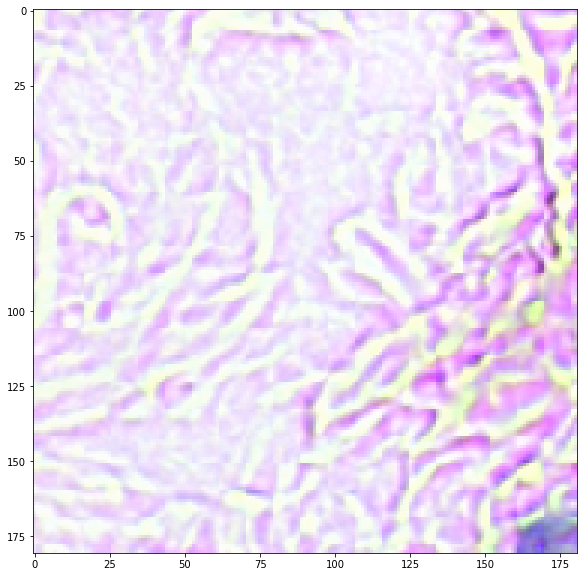

In [44]:
plt.imshow(imgs[i])

In [45]:
adata.obs['highlight'] = ['target' if c==test_id else False for c in adata.obs.index]

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


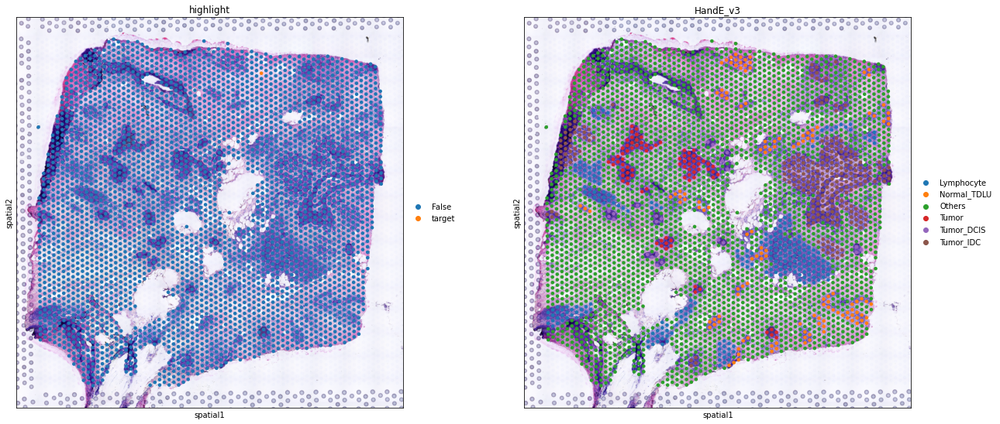

In [54]:
sc.pl.spatial(adata, color=['highlight', 'HandE_v3'])

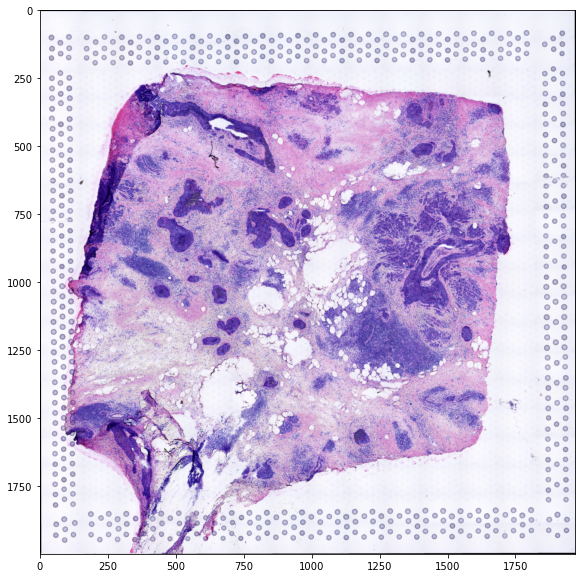

In [18]:
plt.imshow(img)

In [ ]:
plt.imshow(resized)

In [47]:
from skimage.transform import resize
def extract_spot_images(adata, full_res, key='BRCA_206B1'):
    coords = adata.obsm['spatial']    
    scaler = adata.uns['spatial'][key]['scalefactors']['tissue_hires_scalef']
    d = adata.uns['spatial'][key]['scalefactors']['spot_diameter_fullres']
    
    boxes = []
    for c, r in coords:
        r1, r2 = int(r - (d * .5)),  int(r + (d * .5))
        c1, c2 =  int(c - (d * .5)),  int(c + (d * .5))
        boxes.append([(r1, c1), (r2, c2)])

    imgs = [full_res[r1:r2, c1:c2] for (r1, c1), (r2, c2) in boxes]
    # imgs = [resize(img, (64, 64, 3)) for img in imgs]
    return imgs

In [48]:
imgs = extract_spot_images(adata, he_img)
len(imgs)

3651

In [49]:
# export data
adata.obs

,in_tissue,array_row,array_col,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters,orig_cluster,cell_type_image,HandE_v3,highlight
AAACAAGTATCTCCCA-1,1,50,102,SeuratProject,1195,778,5615,1444,0,0,0,Connective_1,Others,False
AAACAATCTACTAGCA-1,1,3,43,SeuratProject,40160,7370,7616,3449,2,2,2,DCIS_connective,Tumor_IDC,False
AAACACCAATAACTGC-1,1,59,19,SeuratProject,24709,6244,7450,3396,10,10,10,Connective_5,Others,False
AAACAGAGCGACTCCT-1,1,14,94,SeuratProject,1842,1020,5852,1394,1,1,1,Connective_2,Others,False
AAACAGCTTTCAGAAG-1,1,43,9,SeuratProject,49222,9217,8601,4330,7,7,7,TDLU,Normal_TDLU,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77,SeuratProject,6233,2829,6598,2828,8,8,8,Connective_3,Others,False
TTGTTTCACATCCAGG-1,1,58,42,SeuratProject,44782,7502,7672,3442,6,6,6,IDC,Tumor_IDC,False
TTGTTTCATTAGTCTA-1,1,60,30,SeuratProject,4678,2127,6315,2127,4,4,4,Connective_4,Others,False
TTGTTTCCATACAACT-1,1,45,27,SeuratProject,1730,978,5789,1387,0,0,0,Connective_1,Others,False


In [55]:
from collections import Counter
Counter(adata.obs['HandE_v3'])

Counter({'Others': 2883,
         'Tumor_IDC': 277,
         'Normal_TDLU': 133,
         'Lymphocyte': 250,
         'Tumor': 85,
         'Tumor_DCIS': 23})

In [51]:
adata.uns['cell_to_HE'] = {c:img for c, img in zip(adata.obs.index, imgs)}


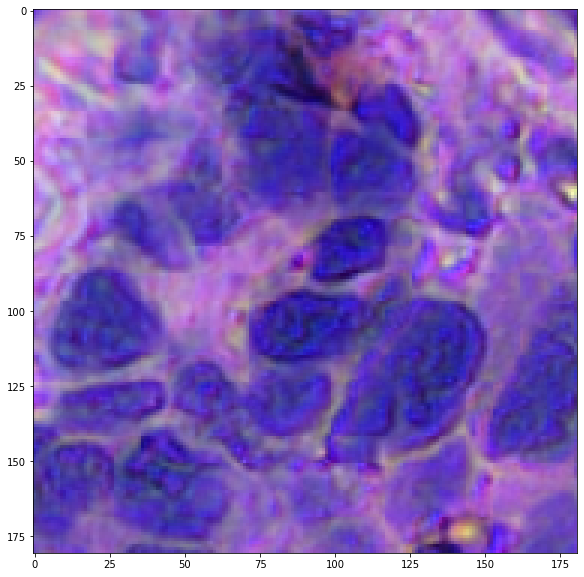

In [52]:
plt.imshow(adata.uns['cell_to_HE']['TTGTTTCACATCCAGG-1'])

In [104]:
!mkdir ../data/brca_HT206/model_training_v2/trans

In [102]:
# metadata = adata.obs[[True if x != 'Others' else False
#                      for x in adata.obs['HandE_v3']]]
metadata = adata.obs.copy()
metadata.to_csv('../data/brca_HT206/model_training_v2/metadata.txt', sep='\t')

In [108]:
pow(2, 8)

256

In [117]:
!ls ../data/brca_HT206/model_training_v2/

he           metadata.txt trans


In [141]:
from PIL import Image
imgs = [adata.uns['cell_to_HE'][i] for i in metadata.index]
from skimage.transform import resize
# X = None
for x, s_id in zip(imgs, metadata.index):
    reshaped = resize(x, (112, 112, 3))
    im = Image.fromarray((reshaped * 255).astype(np.uint8))
    im.save(f'../data/brca_HT206/model_training_v2/he/{s_id}.jpeg')
#     reshaped = np.expand_dims(reshaped, axis=0)
#     if X is None:
#         X = reshaped
#     else:
#         X = np.concatenate((X, reshaped), axis=0)
# X.shape

# np.save('../data/brca_HT206/model_training_v2/images.npy', X)

In [113]:
# now get the transcriptomics
df = pd.read_csv("../data/brca_HT206/sctransform_scaled.txt", sep='\t')
df

,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACATTTCCCGGATT-1,AAACCCGAACGAAATC-1,AAACCGGGTAGGTACC-1,AAACCGTTCGTCCAGG-1,...,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTCTAGATACGCT-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTGTAAATTC-1
AL627309.1,-0.005607,-0.076938,-0.060601,-0.009919,-0.084571,0.000190,-0.047216,-0.024661,-0.021013,-0.055737,...,-0.106688,-0.067405,-0.029016,-0.047997,-0.030557,-0.027317,-0.080966,-0.022392,-0.009243,-0.037133
AL627309.5,-0.039133,3.953426,-0.163833,-0.049013,-0.216289,-0.025859,-0.133905,-0.082742,-0.074408,-0.153003,...,-0.263062,-0.178886,-0.092674,-0.135661,-0.096184,-0.088802,-0.208508,-0.077558,-0.047465,-0.111126
LINC01409,-0.056014,-0.280952,-0.231278,-0.069952,-0.303586,-0.037313,-0.189512,-0.117558,-0.105798,-0.216201,...,-0.366797,-0.252158,-0.131563,-0.191971,-0.136510,-0.126105,-0.292947,-0.110245,11.042424,-0.157542
LINC01128,-0.091741,0.900069,-0.433672,-0.118877,-0.571353,-0.055516,-0.352727,-0.212011,-0.188969,-0.404546,...,0.251348,-0.473798,-0.239456,1.950228,-0.249148,-0.228760,0.794842,-0.197680,-0.114618,-0.290324
LINC00115,-0.022728,-0.206714,-0.165647,-0.034038,-0.225555,-0.007554,-0.131368,-0.072697,-0.063139,-0.153250,...,-0.278686,-0.182866,-0.084087,-0.133381,-0.088114,-0.079647,-0.216687,-0.066752,-0.032265,-0.105251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AL354822.1,-0.008172,-0.074900,-0.059517,-0.012172,-0.082109,-0.002804,-0.046959,-0.025884,-0.022486,-0.054949,...,-0.103080,-0.065917,-0.029944,-0.047690,-0.031382,-0.028360,-0.078703,-0.023769,-0.011545,-0.037524
AL592183.1,-0.043663,-0.180027,-0.149508,-0.052073,-0.194085,-0.032345,-0.124122,-0.080729,-0.073654,-0.140320,...,-0.233992,-0.162287,-0.089156,-0.125611,-0.092134,-0.085871,-0.187464,-0.076329,-0.050756,-0.104806
AC240274.1,-0.051380,-0.175946,-0.148038,-0.059067,-0.188817,-0.041029,-0.124849,-0.085236,-0.078777,-0.139642,...,-0.225428,-0.159718,-0.092928,-0.126209,-0.095647,-0.089930,-0.182753,-0.081219,-0.057863,-0.107214
AC004556.3,-0.201425,-0.159326,-0.800795,-0.247113,-0.327856,-0.141459,-0.656139,-0.407467,2.290213,-0.748691,...,-0.737825,-0.872581,-0.455504,-0.664676,-0.472535,-0.436750,2.031504,-0.382503,-0.239905,-0.545215


In [114]:
adata.obs

,in_tissue,array_row,array_col,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters,orig_cluster,cell_type_image,HandE_v3,highlight
AAACAAGTATCTCCCA-1,1,50,102,SeuratProject,1195,778,5615,1444,0,0,0,Connective_1,Others,False
AAACAATCTACTAGCA-1,1,3,43,SeuratProject,40160,7370,7616,3449,2,2,2,DCIS_connective,Tumor_IDC,False
AAACACCAATAACTGC-1,1,59,19,SeuratProject,24709,6244,7450,3396,10,10,10,Connective_5,Others,False
AAACAGAGCGACTCCT-1,1,14,94,SeuratProject,1842,1020,5852,1394,1,1,1,Connective_2,Others,False
AAACAGCTTTCAGAAG-1,1,43,9,SeuratProject,49222,9217,8601,4330,7,7,7,TDLU,Normal_TDLU,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77,SeuratProject,6233,2829,6598,2828,8,8,8,Connective_3,Others,False
TTGTTTCACATCCAGG-1,1,58,42,SeuratProject,44782,7502,7672,3442,6,6,6,IDC,Tumor_IDC,False
TTGTTTCATTAGTCTA-1,1,60,30,SeuratProject,4678,2127,6315,2127,4,4,4,Connective_4,Others,False
TTGTTTCCATACAACT-1,1,45,27,SeuratProject,1730,978,5789,1387,0,0,0,Connective_1,Others,False


In [118]:
df.to_csv('../data/brca_HT206/model_training_v2/transcriptomics.tsv', sep='\t')

In [98]:
adata.obsm['spatial']

array([[13936, 16758],
       [ 2447,  8630],
       [16013,  5155],
       ...,
       [16271,  6688],
       [12624,  6303],
       [ 3429,  9738]])

In [97]:
len(set(adata.obsm['spatial'][:, 0].flatten()))

3651

In [143]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df.values.transpose())

StandardScaler()

In [144]:
#transcription image
rc_to_id = {(r, c):i for i, r, c in zip(adata.obs.index, adata.obs['array_row'], adata.obs['array_col'])}
row_max = np.max(adata.obs['array_row'])
col_max = np.max(adata.obs['array_col'])
X = np.zeros((row_max, col_max, df.shape[0])).astype(np.float32)
for r in range(row_max):
    for c in range(col_max):
        spot_id = rc_to_id.get((r, c))
        if spot_id is not None:
            x = df[spot_id].to_numpy()
            X[r, c] = scaler.transform([x])[0]
        
        

# adata.X.shape

In [145]:
X.shape

(72, 127, 20444)

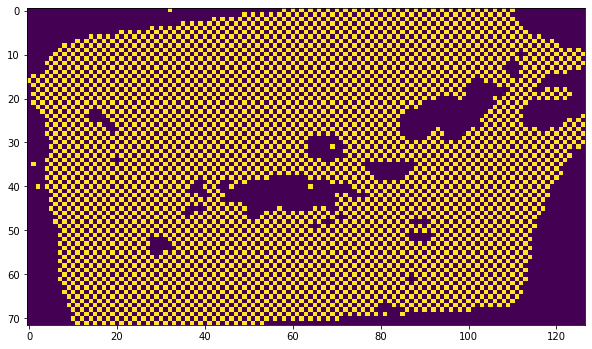

In [146]:
plt.imshow(np.count_nonzero(X, axis=2))

In [147]:
np.save('../data/brca_HT206/model_training_v2/trans_block.npy', X)

In [134]:
import json
json.dump({f'{r}_{c}':s for (r, c), s in rc_to_id.items()},
          open('../data/brca_HT206/model_training_v2/trans_rc_to_id.json', 'w'))

In [129]:
# pad = 4
# for (r, c), sid in rc_to_id.items():
#     if r - pad > 0 and r + pad < row_max and c - pad > 0 and c + pad < col_max:
#         x = X[r - pad:r + pad, c - pad:c + pad]
#         print(x.shape)
#         tifffile.imsave(f'../data/brca_HT206/model_training_v2/trans/{sid}.tiff', x)

In [81]:
df['AAACAAGTATCTCCCA-1'].to_numpy()

array([-0.00560666, -0.03913274, -0.05601397, ..., -0.05138023,
       -0.2014248 , -0.1132555 ])

In [75]:
adata.obs

,in_tissue,array_row,array_col,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters,orig_cluster,cell_type_image,HandE_v3,highlight
AAACAAGTATCTCCCA-1,1,50,102,SeuratProject,1195,778,5615,1444,0,0,0,Connective_1,Others,False
AAACAATCTACTAGCA-1,1,3,43,SeuratProject,40160,7370,7616,3449,2,2,2,DCIS_connective,Tumor_IDC,False
AAACACCAATAACTGC-1,1,59,19,SeuratProject,24709,6244,7450,3396,10,10,10,Connective_5,Others,False
AAACAGAGCGACTCCT-1,1,14,94,SeuratProject,1842,1020,5852,1394,1,1,1,Connective_2,Others,False
AAACAGCTTTCAGAAG-1,1,43,9,SeuratProject,49222,9217,8601,4330,7,7,7,TDLU,Normal_TDLU,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77,SeuratProject,6233,2829,6598,2828,8,8,8,Connective_3,Others,False
TTGTTTCACATCCAGG-1,1,58,42,SeuratProject,44782,7502,7672,3442,6,6,6,IDC,Tumor_IDC,False
TTGTTTCATTAGTCTA-1,1,60,30,SeuratProject,4678,2127,6315,2127,4,4,4,Connective_4,Others,False
TTGTTTCCATACAACT-1,1,45,27,SeuratProject,1730,978,5789,1387,0,0,0,Connective_1,Others,False


In [77]:
adata.obsm['spatial']

array([[13936, 16758],
       [ 2447,  8630],
       [16013,  5155],
       ...,
       [16271,  6688],
       [12624,  6303],
       [ 3429,  9738]])

In [76]:
set(adata.obs['array_row'])

{0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72}

In [120]:
## evaluate
df = pd.read_csv('/Users/erikstorrs/Downloads/metadata_with_predictions (2).txt', sep='\t')
df

,Unnamed: 0,Unnamed: 0.1,in_tissue,array_row,array_col,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters,orig_cluster,cell_type_image,HandE_v3,predicted,label,prediction
0,1,AAACAATCTACTAGCA-1,1,3,43,SeuratProject,40160,7370,7616,3449,2,2,2,DCIS_connective,Tumor_IDC,Lymphocyte,Tumor_IDC,Lymphocyte
1,4,AAACAGCTTTCAGAAG-1,1,43,9,SeuratProject,49222,9217,8601,4330,7,7,7,TDLU,Normal_TDLU,Tumor_IDC,Normal_TDLU,Tumor_IDC
2,11,AAACCTCATGAAGTTG-1,1,37,19,SeuratProject,8756,3721,7892,3718,7,7,7,TDLU,Normal_TDLU,Lymphocyte,Normal_TDLU,Lymphocyte
3,18,AAACTCGGTTCGCAAT-1,1,66,70,SeuratProject,99615,9056,6970,2486,6,6,6,IDC,Tumor_IDC,Tumor_IDC,Tumor_IDC,Tumor_IDC
4,23,AAAGACCCAAGTCGCG-1,1,10,48,SeuratProject,22433,5977,7946,3639,9,9,9,lymphocytes,Lymphocyte,Lymphocyte,Lymphocyte,Tumor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
763,3598,TTGCGGCATCAGAAAG-1,1,53,45,SeuratProject,109927,10103,7367,3269,6,6,6,IDC,Tumor_IDC,Tumor_IDC,Tumor_IDC,Tumor_IDC
764,3612,TTGGACCTATAACAGT-1,1,56,86,SeuratProject,67988,9555,7727,3383,7,7,7,TDLU,Lymphocyte,Lymphocyte,Lymphocyte,Lymphocyte
765,3634,TTGTGAACCTAATCCG-1,1,56,90,SeuratProject,6552,2617,6797,2616,0,0,0,Connective_1,Lymphocyte,Lymphocyte,Lymphocyte,Tumor_IDC
766,3641,TTGTGTATGCCACCAA-1,1,56,60,SeuratProject,83815,8987,7376,3020,6,6,6,IDC,Tumor_IDC,Tumor_IDC,Tumor_IDC,Tumor_IDC


In [123]:
to_prediction = {c:d for c, d in zip(df['Unnamed: 0.1'], df['prediction'])}
adata.obs['predicted'] = [to_prediction.get(x, 'Others') for x in adata.obs.index]
adata.obs

,in_tissue,array_row,array_col,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters,orig_cluster,cell_type_image,HandE_v3,predicted
AAACAAGTATCTCCCA-1,1,50,102,SeuratProject,1195,778,5615,1444,0,0,0,Connective_1,Others,Others
AAACAATCTACTAGCA-1,1,3,43,SeuratProject,40160,7370,7616,3449,2,2,2,DCIS_connective,Tumor_IDC,Lymphocyte
AAACACCAATAACTGC-1,1,59,19,SeuratProject,24709,6244,7450,3396,10,10,10,Connective_5,Others,Others
AAACAGAGCGACTCCT-1,1,14,94,SeuratProject,1842,1020,5852,1394,1,1,1,Connective_2,Others,Others
AAACAGCTTTCAGAAG-1,1,43,9,SeuratProject,49222,9217,8601,4330,7,7,7,TDLU,Normal_TDLU,Tumor_IDC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77,SeuratProject,6233,2829,6598,2828,8,8,8,Connective_3,Others,Others
TTGTTTCACATCCAGG-1,1,58,42,SeuratProject,44782,7502,7672,3442,6,6,6,IDC,Tumor_IDC,Tumor_IDC
TTGTTTCATTAGTCTA-1,1,60,30,SeuratProject,4678,2127,6315,2127,4,4,4,Connective_4,Others,Others
TTGTTTCCATACAACT-1,1,45,27,SeuratProject,1730,978,5789,1387,0,0,0,Connective_1,Others,Others


/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'predicted' as categorical


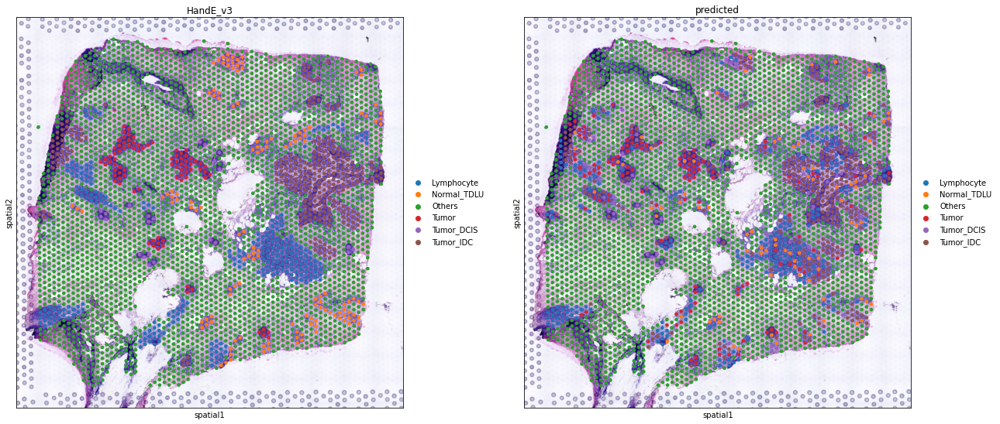

In [124]:
sc.pl.spatial(adata, color=['HandE_v3', 'predicted'])

In [125]:
emb = np.load('/Users/erikstorrs/Downloads/embeddings.npy')
emb.shape

(768, 1280)

In [126]:
filtered = adata[adata.obs['HandE_v3']!='Others']
filtered

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


View of AnnData object with n_obs × n_vars = 768 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'seurat_clusters', 'orig_cluster', 'cell_type_image', 'HandE_v3', 'predicted'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'cell_to_HE', 'HandE_v3_colors', 'predicted_colors', 'cell_type_image_colors'
    obsm: 'spatial'

In [127]:
filtered.obsm['classifier_embeddings'] = emb

In [129]:
from sklearn.preprocessing import StandardScaler
import umap
filtered.obsm['X_umap_embedding'] = umap.UMAP().fit_transform(StandardScaler().fit_transform(emb))

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


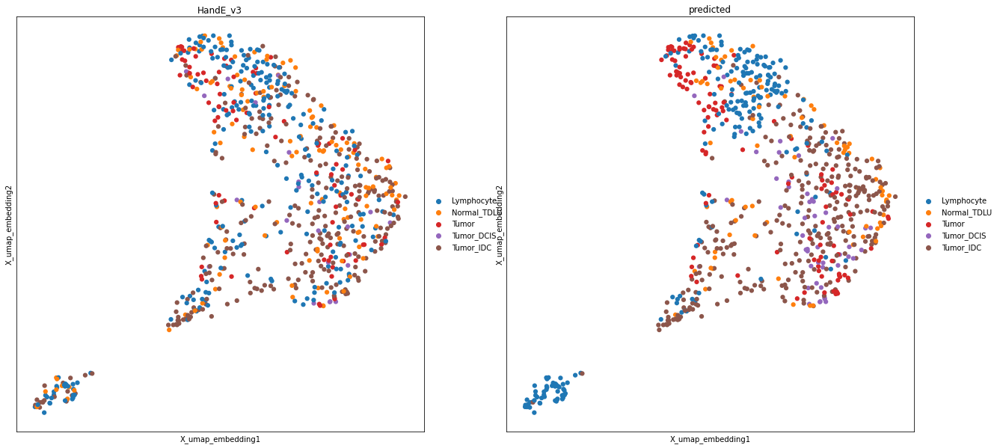

In [130]:
sc.pl.embedding(filtered, basis='X_umap_embedding', color=['HandE_v3', 'predicted'])

In [136]:
import anndata
emb_adata = anndata.AnnData(X=emb, obs=filtered.obs)
sc.pp.scale(emb_adata)
sc.pp.neighbors(emb_adata, use_rep='X', n_neighbors=5)
# sc.pp.pca(emb_adata)

sc.tl.umap(emb_adata)
sc.tl.leiden(emb_adata, resolution=1.)
emb_adata

AnnData object with n_obs × n_vars = 768 × 1280
    obs: 'in_tissue', 'array_row', 'array_col', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'seurat_clusters', 'orig_cluster', 'cell_type_image', 'HandE_v3', 'predicted', 'leiden'
    var: 'mean', 'std'
    uns: 'neighbors', 'umap', 'leiden'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

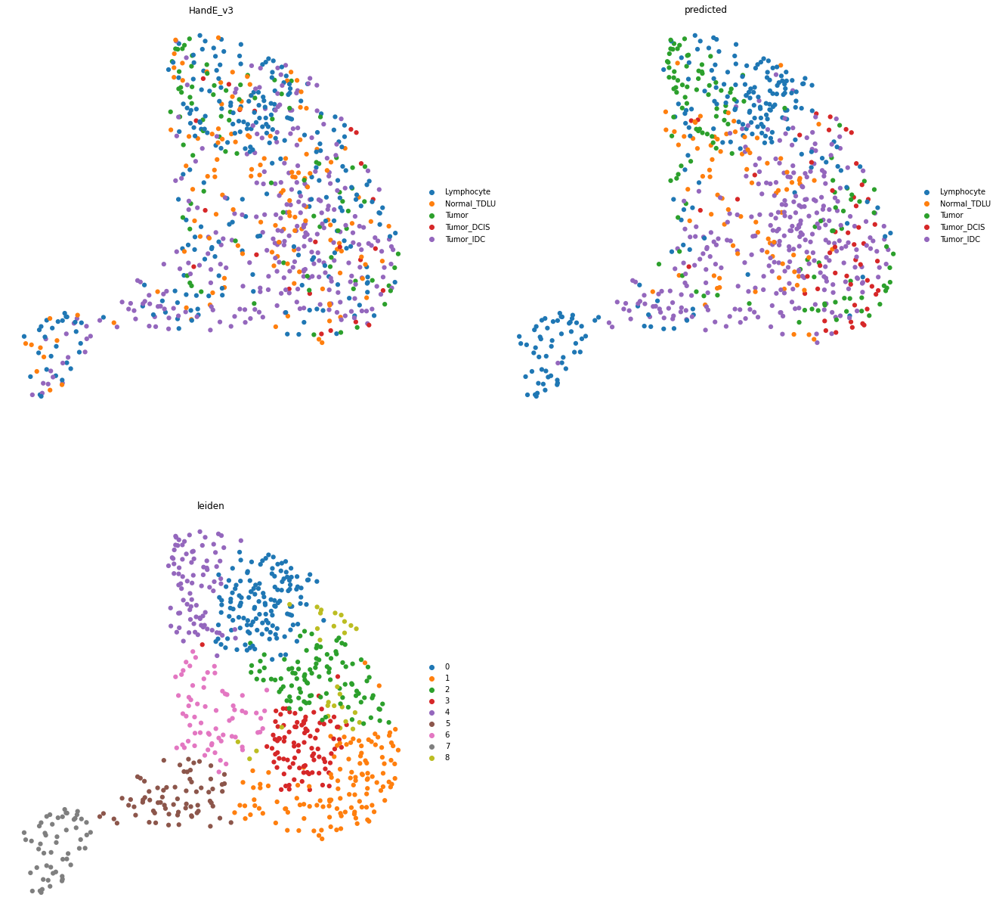

In [167]:
plt.rcParams["figure.figsize"] = (10, 10)
sc.pl.umap(emb_adata, color=['HandE_v3', 'predicted', 'leiden'], frameon=False,
          ncols=2)

In [143]:
emb_adata[emb_adata.obs['leiden']=='7'].obs.index[:5]

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


Index(['AAACAATCTACTAGCA-1', 'AACAATACATTGTCGA-1', 'AACCTGTCACGGAATT-1',
       'ACCGGTCTGAGTACGG-1', 'ACTATTTCCGGGCCCA-1'],
      dtype='object')

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


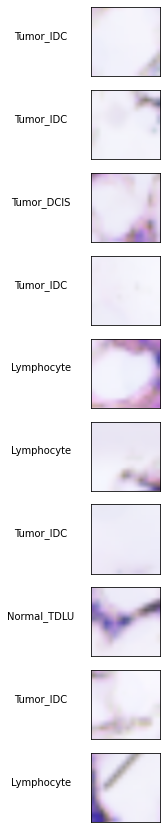

In [168]:
plt.rcParams["figure.figsize"] = (5, 15)
ids = emb_adata[emb_adata.obs['leiden']=='5'].obs.index[:10]
mask = [True if x in ids else False
       for x in adata.obs.index]
fig, axs = plt.subplots(nrows=len(ids), ncols=1)
for i, (cell_id, img) in enumerate(zip(ids, X[mask])):
    ax = axs[i]
#     print(emb_adata.obs.loc[i, 'HandE_v3'])
    ax.imshow(img)
    ax.set_ylabel(emb_adata.obs.loc[cell_id, 'HandE_v3'], rotation=0, labelpad=50)
    ax.set_xticks([])
    ax.set_yticks([])
#     plt.show()

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


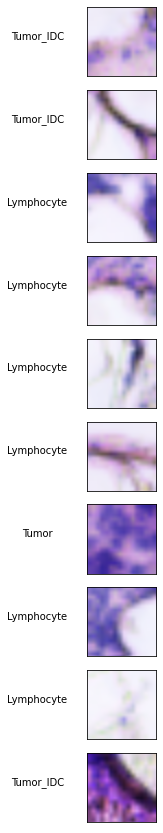

In [161]:
plt.rcParams["figure.figsize"] = (5, 15)
ids = emb_adata[emb_adata.obs['leiden']=='6'].obs.index[:10]
mask = [True if x in ids else False
       for x in adata.obs.index]
fig, axs = plt.subplots(nrows=len(ids), ncols=1)
for i, (cell_id, img) in enumerate(zip(ids, X[mask])):
    ax = axs[i]
#     print(emb_adata.obs.loc[i, 'HandE_v3'])
    ax.imshow(img)
    ax.set_ylabel(emb_adata.obs.loc[cell_id, 'HandE_v3'], rotation=0, labelpad=50)
    ax.set_xticks([])
    ax.set_yticks([])
#     plt.show()

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


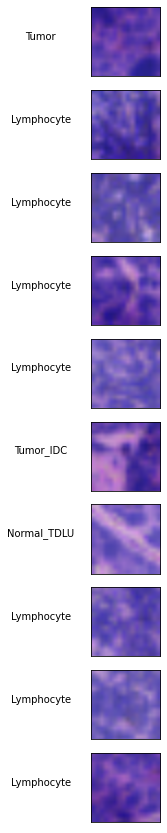

In [159]:
plt.rcParams["figure.figsize"] = (5, 15)
ids = emb_adata[emb_adata.obs['leiden']=='4'].obs.index[:10]
mask = [True if x in ids else False
       for x in adata.obs.index]
fig, axs = plt.subplots(nrows=len(ids), ncols=1)
for i, (cell_id, img) in enumerate(zip(ids, X[mask])):
    ax = axs[i]
#     print(emb_adata.obs.loc[i, 'HandE_v3'])
    ax.imshow(img)
    ax.set_ylabel(emb_adata.obs.loc[cell_id, 'HandE_v3'], rotation=0, labelpad=50)
    ax.set_xticks([])
    ax.set_yticks([])
#     plt.show()

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


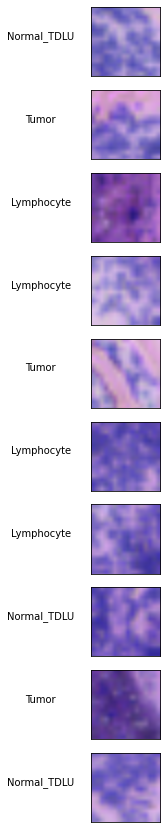

In [158]:
plt.rcParams["figure.figsize"] = (5, 15)
ids = emb_adata[emb_adata.obs['leiden']=='0'].obs.index[:10]
mask = [True if x in ids else False
       for x in adata.obs.index]
fig, axs = plt.subplots(nrows=len(ids), ncols=1)
for i, (cell_id, img) in enumerate(zip(ids, X[mask])):
    ax = axs[i]
#     print(emb_adata.obs.loc[i, 'HandE_v3'])
    ax.imshow(img)
    ax.set_ylabel(emb_adata.obs.loc[cell_id, 'HandE_v3'], rotation=0, labelpad=50)
    ax.set_xticks([])
    ax.set_yticks([])
#     plt.show()

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


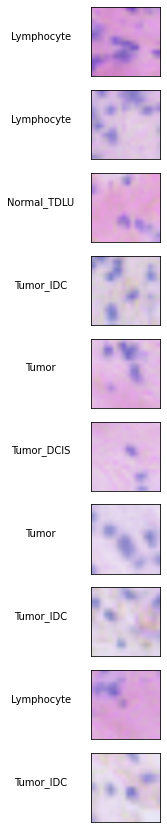

In [162]:
plt.rcParams["figure.figsize"] = (5, 15)
ids = emb_adata[emb_adata.obs['leiden']=='1'].obs.index[:10]
mask = [True if x in ids else False
       for x in adata.obs.index]
fig, axs = plt.subplots(nrows=len(ids), ncols=1)
for i, (cell_id, img) in enumerate(zip(ids, X[mask])):
    ax = axs[i]
#     print(emb_adata.obs.loc[i, 'HandE_v3'])
    ax.imshow(img)
    ax.set_ylabel(emb_adata.obs.loc[cell_id, 'HandE_v3'], rotation=0, labelpad=50)
    ax.set_xticks([])
    ax.set_yticks([])
#     plt.show()

/Users/erikstorrs/miniconda3/envs/spatial/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


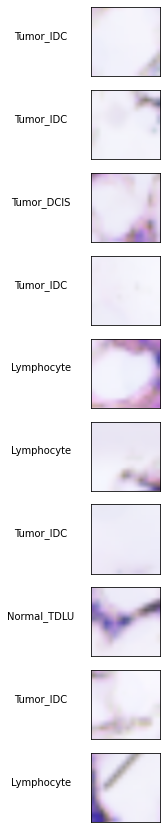

In [163]:
plt.rcParams["figure.figsize"] = (5, 15)
ids = emb_adata[emb_adata.obs['leiden']=='5'].obs.index[:10]
mask = [True if x in ids else False
       for x in adata.obs.index]
fig, axs = plt.subplots(nrows=len(ids), ncols=1)
for i, (cell_id, img) in enumerate(zip(ids, X[mask])):
    ax = axs[i]
#     print(emb_adata.obs.loc[i, 'HandE_v3'])
    ax.imshow(img)
    ax.set_ylabel(emb_adata.obs.loc[cell_id, 'HandE_v3'], rotation=0, labelpad=50)
    ax.set_xticks([])
    ax.set_yticks([])
#     plt.show()

In [145]:
X.shape

(3651, 64, 64, 3)

In [70]:
# !pip install synapseclient

In [71]:
import synapseclient 
import synapseutils 

In [72]:
syn = synapseclient.Synapse() 
syn.login('estorrs','bZPN7&21RndW') 
# files = synapseutils.syncFromSynapse(syn, ' syn21788217 ') 

Welcome, Erik Storrs!



In [73]:
files = synapseutils.syncFromSynapse(syn, ' syn22222600') 

ValueError: Cannot initiate a sync from an entity that is not a File or Folder